In [1]:
%load_ext autoreload
%autoreload 2

***
# Test Notebook to test the code
***

In [2]:
import os
import pretty_midi
import numpy as np
import torch
import matplotlib.pyplot as plt
import librosa
from torch.utils.data import DataLoader, Dataset
from pathlib import Path
import soundfile as sf

(128, 15486)


/tmp/ipykernel_359048/2916101068.py:8: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll, y_axis='cqt_note', cmap=plt.cm.hot)


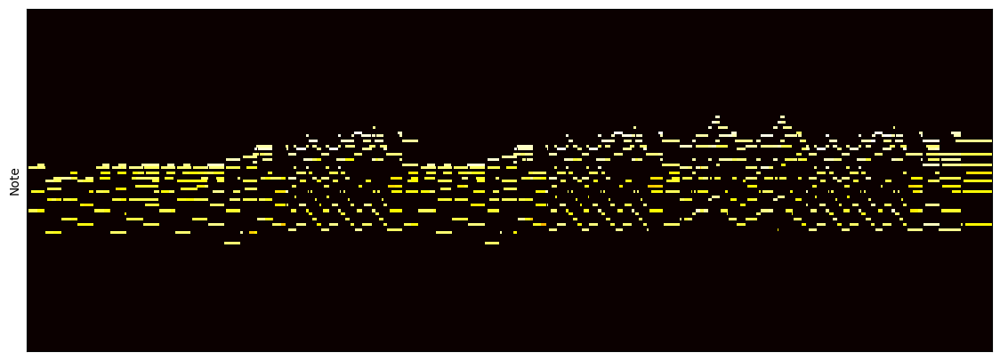

In [6]:
midi_path = '/mnt/ssd-samsung/atiam/projet_ml/dataset/1jxuA9dJiIY/rikm9eS6JAE.mid'
pm = pretty_midi.PrettyMIDI(midi_path)

piano_roll = pm.get_piano_roll()
piano_roll = piano_roll
print(piano_roll.shape)
plt.figure(figsize=(14, 5))
librosa.display.specshow(piano_roll, y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()

In [3]:
def remove_short_notes(roll, min_len=0):
    """
    roll: Tensor (B, 1, 128, T) or (128, T)
    min_len: minimum number of consecutive frames to keep a note
    """
    if roll.dim() == 2:
        roll = roll.unsqueeze(0).unsqueeze(0)  # (1,1,128,T)

    B, C, P, T = roll.shape
    cleaned = roll.clone()

    for b in range(B):
        for p in range(P):
            active = roll[b, 0, p] > 0  # (T,)

            # Find note segments
            diff = active.int().diff(prepend=torch.tensor([0], device=roll.device))
            starts = torch.where(diff == 1)[0]
            ends   = torch.where(diff == -1)[0]

            if len(ends) < len(starts):
                ends = torch.cat([ends, torch.tensor([T], device=roll.device)])

            for s, e in zip(starts, ends):
                if (e - s) < min_len:
                    cleaned[b, 0, p, s:e] = 0.0

    return cleaned.squeeze(0).squeeze(0)

def remove_chromatic_neighbors(roll):
    """
    roll: Tensor (128, T) or (B, 1, 128, T)
    Removes notes that are adjacent in pitch (±1 semitone).
    """
    if roll.dim() == 2:
        roll = roll.unsqueeze(0).unsqueeze(0)

    B, C, P, T = roll.shape
    cleaned = roll.clone()

    for b in range(B):
        for t in range(T):
            active = roll[b, 0, :, t] > 0
            pitches = torch.where(active)[0]

            for p in pitches:
                if (p > 0 and active[p - 1]) or (p < P - 1 and active[p + 1]):
                    cleaned[b, 0, p, t] = 0.0

    return cleaned.squeeze(0).squeeze(0)

In [11]:
# Test VAE #

from models.vae import PianoRollResNetVAE
from preprocess.vae_inference import midi_to_chunks, chunks_to_midi
from train_vae import PianoRollDataset, calculate_pos_weight, WeightedReconLoss

device = "cuda" if torch.cuda.is_available() else "cpu"

# Charger le modèle
model_vae = PianoRollResNetVAE(base_channels=32, channel_mults=(1, 2, 4, 8))
model_vae = model_vae.to(device)
model_vae.eval()

checkpoint_path = "/mnt/ssd-samsung/atiam/projet_ml/ckpts/best_model_vae.pth"
# checkpoint_path = "ckpts/vae_ep35.pth"
model_vae.load_state_dict(torch.load(checkpoint_path, map_location=device))
print(f"Loaded model_vae from {checkpoint_path}")

chunks = midi_to_chunks(midi_path)
print(f"Chunks shape: {chunks.shape}")

with torch.no_grad():
    x = chunks.to(device)

    recon_logits, mu, log_var = model_vae(x)
    pred = torch.sigmoid(recon_logits)

    print(f"Logits Range: {recon_logits.min().item():.2f} to {recon_logits.max().item():.2f}")
    print(f"Probs Range:  {pred.min().item():.2f} to {pred.max().item():.2f}")

    mask = (x > 0.2)
    if mask.sum() > 0:
        val_l1_err = torch.abs(pred[mask] - x[mask]).mean().item()
    print(val_l1_err)

    threshold = 0.2
    pred_binary = (pred > threshold).float()

    # Restore Velocity (Optional)
    # If binary is 1, we keep the probability value as velocity
    # If binary is 0, it becomes 0
    # recon_roll = pred
    recon_roll = pred * pred_binary
    recon_roll = remove_short_notes(recon_roll, min_len=0)
    #recon_roll = remove_chromatic_neighbors(recon_roll)
    print(recon_roll.unique())


    print(recon_roll.shape)
    # Pass the PROCESSED roll to MIDI, not the logits
    recon_pm = chunks_to_midi(recon_roll)
    gt_pm = chunks_to_midi(chunks)

Loaded model_vae from /mnt/ssd-samsung/atiam/projet_ml/ckpts/best_model_vae.pth
Chunks shape: torch.Size([29, 1, 128, 1024])
Logits Range: -81.50 to 1.08
Probs Range:  0.00 to 0.75
0.006794966757297516
tensor([0.0000, 0.2003, 0.2007,  ..., 0.7458, 0.7458, 0.7460], device='cuda:0')
torch.Size([29, 1, 128, 1024])


(128, 15022)


/tmp/ipykernel_359048/2271579717.py:6: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll[:, 1000:8000], y_axis='cqt_note', cmap=plt.cm.hot)


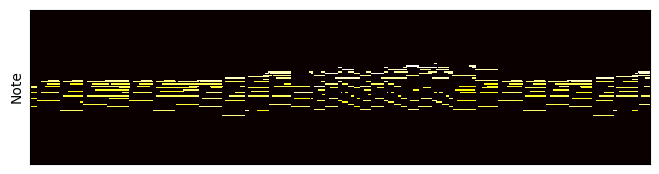

/tmp/ipykernel_359048/2271579717.py:10: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll_gt[:, 1000:8000], y_axis='cqt_note', cmap=plt.cm.hot)


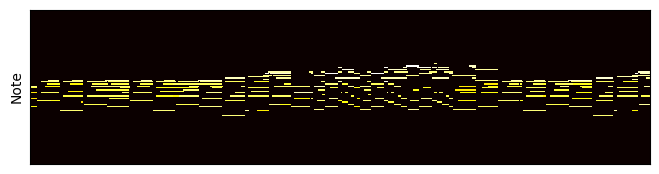

In [8]:
piano_roll = recon_pm.get_piano_roll()
print(piano_roll.shape)
piano_roll_gt = gt_pm.get_piano_roll()

plt.figure(figsize=(8, 2))
librosa.display.specshow(piano_roll[:, 1000:8000], y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()

plt.figure(figsize=(8, 2))
librosa.display.specshow(piano_roll_gt[:, 1000:8000], y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()


In [9]:
from IPython.display import Audio
import pretty_midi

def listen_to_piano_roll(piano_roll, sr=24000, program=0):
    """
    Convert a piano roll to audio and display it for listening.

    Args:
        piano_roll: numpy array of shape (128, time_steps) or torch tensor
        sr: sample rate (default 24000 Hz)
        program: MIDI instrument program (0=acoustic piano)

    Returns:
        PrettyMIDI object
    """
    # Convert torch tensor to numpy if needed
    if isinstance(piano_roll, torch.Tensor):
        print(piano_roll.shape)
        piano_roll = piano_roll.squeeze().cpu().numpy()

    # Create PrettyMIDI object
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=program, is_drum=False)

    # Time resolution: each column is one frame
    # Calculate frame duration based on your config
    frame_duration = 1.0 / 100  # 100 fps from your CFG

    # Convert piano roll to MIDI notes
    for pitch in range(128):
        note_on = False
        start_time = 0
        velocity = 0
        for time_step in range(piano_roll.shape[1]):
            value = piano_roll[pitch, time_step]

            if value > 0.2 and not note_on:
                # Note starts
                note_on = True
                start_time = time_step * frame_duration
                velocity = int(min(127, value * 127))

            elif value <= 0.1 and note_on:
                # Note ends
                note_on = False
                end_time = time_step * frame_duration
                note = pretty_midi.Note(
                    velocity=velocity,
                    pitch=pitch,
                    start=start_time,
                    end=end_time
                )
                instrument.notes.append(note)

        # Handle note that extends to the end
        if note_on:
            end_time = piano_roll.shape[1] * frame_duration
            note = pretty_midi.Note(
                velocity=velocity,
                pitch=pitch,
                start=start_time,
                end=end_time
            )
            instrument.notes.append(note)

    pm.instruments.append(instrument)

    # Synthesize to audio
    try:
        audio = pm.fluidsynth(fs=sr)
        audio = np.asarray(audio, dtype=np.float32)
        print(f"Piano roll duration: {pm.get_end_time():.2f} seconds")
        display(Audio(audio, rate=sr))
    except Exception as e:
        print(f"Error synthesizing audio: {e}")
        print("Make sure fluidsynth is installed: apt-get install fluidsynth")

    return pm

In [10]:
listen_to_piano_roll(piano_roll)

listen_to_piano_roll(piano_roll_gt)

Piano roll duration: 150.22 seconds


Piano roll duration: 150.22 seconds


In [30]:
print("Loading models...")
from models.transformer import Pop2PianoDiT_CrossAttn
from models.conditioner import AudioConditioner
from inference import DiffusionSampler, load_pairs, load_audio_chunk
from tqdm import tqdm
import torch.nn.functional as F


DATA_ROOT = "/mnt/ssd-samsung/atiam/projet_ml/roll_tensor/"
DEVICE = "cuda"
DIT_CKPT = "/mnt/ssd-samsung/atiam/projet_ml/ckpts/dit_ep150.pth"

num_samples = 10
SR = 24000
LATENT_SCALE = 0.18215

dit = Pop2PianoDiT_CrossAttn(
    input_size=(16, 128),
    patch_size=4,
    in_channels=4,
    hidden_size=384,
    depth=6,
    num_heads=6,
    audio_dim=768
).to(DEVICE).eval()

dit_ckpt = torch.load(DIT_CKPT, map_location=DEVICE)
dit.load_state_dict(dit_ckpt['model'])
conditioner = AudioConditioner().to(DEVICE).eval()
model_vae.to(DEVICE).eval()

sampler = DiffusionSampler(dit)

pairs = load_pairs(DATA_ROOT)[:num_samples]

eps_mse = []
x0_mse = []
decoded_mse = []
predictions, ground_truths = [], []

for latent_path, audio_path in tqdm(pairs, desc="Evaluating"):
    x0 = torch.load(latent_path).to(DEVICE)
    x0 = x0.unsqueeze(0)

    audio_np = load_audio_chunk(audio_path)
    inputs = conditioner.process_audio([audio_np], sampling_rate=SR)
    with torch.no_grad():
        audio_ctx = conditioner(inputs["input_values"].to(DEVICE))

    # ---- epsilon prediction eval ----
    t = torch.randint(0, 1000, (1,), device=DEVICE)
    noise = torch.randn_like(x0)
    x_t = sampler.q_sample(x0, t, noise)

    eps_pred = dit(x_t, t, audio_ctx)
    eps_mse.append(F.mse_loss(eps_pred, noise).item())

    # ---- full sampling eval ----
    x_gen = sampler.ddim_sample(audio_ctx, x0.shape)
    x0_mse.append(F.mse_loss(x_gen, x0).item())

    # decoding x0 with decoder
    with torch.no_grad():
        x0_decoded = model_vae.decode(x0)
        xpred_decoded = model_vae.decode(x_gen)

    predictions.append(xpred_decoded)
    ground_truths.append(x0_decoded)

    decoded_mse.append(F.mse_loss(xpred_decoded, x0_decoded).item())


Loading models...


Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]/home/emiliopicard/miniconda3/envs/csl/lib/python3.9/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/home/emiliopicard/miniconda3/envs/csl/lib/python3.9/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated int

/tmp/ipykernel_359048/85475428.py:6: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pred_roll, y_axis='cqt_note', cmap=plt.cm.hot)


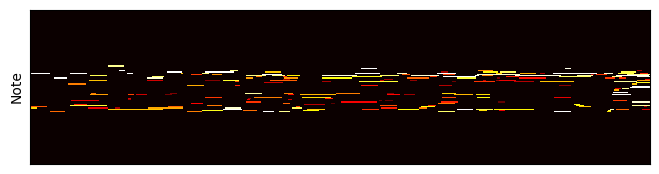

/tmp/ipykernel_359048/85475428.py:16: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(gt_roll, y_axis='cqt_note', cmap=plt.cm.hot)


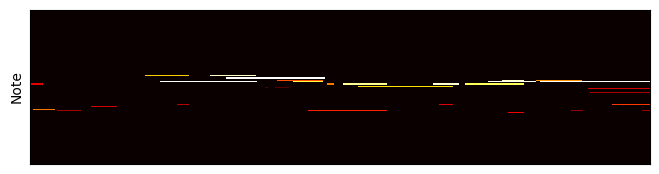

In [33]:
pred = predictions[5]
midi_pred = chunks_to_midi(pred)
pred_roll = midi_pred.get_piano_roll()

plt.figure(figsize=(8, 2))
librosa.display.specshow(pred_roll, y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()

# --------------------

gt = ground_truths[5]
midi_gt = chunks_to_midi(gt)
gt_roll = midi_gt.get_piano_roll()

plt.figure(figsize=(8, 2))
librosa.display.specshow(gt_roll, y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()


In [34]:
listen_to_piano_roll(pred_roll)

listen_to_piano_roll(gt_roll)

Piano roll duration: 10.23 seconds


Piano roll duration: 10.23 seconds


In [ ]:
data_path = "/mnt/ssd-samsung/atiam/projet_ml/roll_tensor/"

from train_diffusion import DiffusionDataset

device = 'cuda'

dataset = DiffusionDataset(data_path)
idx = 12
batch = dataset[idx]
piano_tensor, audio_tensor, note_count = batch
print(piano_tensor.shape, audio_tensor.shape, note_count)
piano_tensor = piano_tensor.to(device)
audio_tensor = audio_tensor.to(device)
note_count = note_count.to(device)

model = PianoRollResNetVAE(base_channels=32, channel_mults=(1, 2, 4, 8))
model = model.to(device)
model.eval()

checkpoint_path = "ckpts/best_model.pth"
# checkpoint_path = "ckpts/vae_ep35.pth"
model.load_state_dict(torch.load(checkpoint_path, map_location=device))
print(f"Loaded model from {checkpoint_path}")

with torch.no_grad():
    # 1. Get Logits
    recon_logits = model.decode(piano_tensor.unsqueeze(0))
    # 2. Apply Sigmoid to get Probabilities (0.0 to 1.0)
    pred = torch.sigmoid(recon_logits)

    # 3. DEBUG: Check the real range
    print(f"Logits Range: {recon_logits.min().item():.2f} to {recon_logits.max().item():.2f}")
    print(f"Probs Range:  {pred.min().item():.2f} to {pred.max().item():.2f}")

    # 4. Apply Hard Thresholding (Crucial for Piano Rolls)
    # Since your model is "weak" (0.5-0.7), we force it to decide.
    # Anything above 0.55 becomes a note.
    threshold = 0.2
    pred_binary = (pred > threshold).float()

    # 5. Restore Velocity (Optional)
    # If binary is 1, we keep the probability value as velocity
    # If binary is 0, it becomes 0
    recon_roll = pred * pred_binary
    recon_roll = remove_short_notes(recon_roll, min_len=0)
    #recon_roll = remove_chromatic_neighbors(recon_roll)
    print(recon_roll.unique())


    print(recon_roll.shape)
    # 6. Pass the PROCESSED roll to MIDI, not the logits
    recon_pm = chunks_to_midi(recon_roll.unsqueeze(0).unsqueeze(0))
    # gt_pm = chunks_to_midi(chunks)

(128, 1023)


/tmp/ipykernel_13813/4247725371.py:5: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll[:, :], y_axis='cqt_note', cmap=plt.cm.hot)


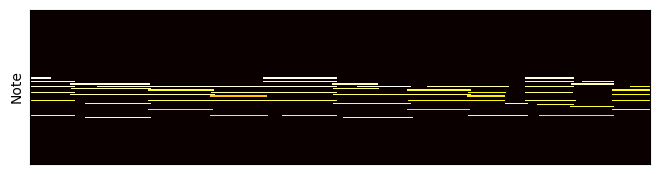

In [ ]:
piano_roll = recon_pm.get_piano_roll()
print(piano_roll.shape)

plt.figure(figsize=(8, 2))
librosa.display.specshow(piano_roll[:, :], y_axis='cqt_note', cmap=plt.cm.hot)
plt.show()
